<a href="https://colab.research.google.com/github/GerardoMunoz/Agenda/blob/main/Rectas_planos_solucionario_2026_0202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#%pylab inline
from matplotlib import pyplot as plt
from matplotlib import animation,rc
#pylab.rcParams['figure.figsize'] = (10, 5)
import sympy as sp
import numpy as np



def ejes2d(x0,y0,x1,y1,k=1):
    ax = plt.axes([0.,0.,k,k*1.34*(y1-y0)/(x1-x0)])
    ax.set_xlim(x0,x1)
    ax.set_ylim(y0,y1)
    punto2d(ax,(0,0),nombre=r'$\vec{0}$')
    return ax


def linea2d(ax,u,v=(0,0),color='k',**kwargs):
    ax.plot((u[0],v[0]),(u[1],v[1]),color)

def punto2d(ax,v,nombre='',fontsize=15,color='k',**kwargs):
    ax.scatter(*v,s=20,color=color)
    if nombre!='':
        ax.text(v[0],v[1],nombre,fontsize=fontsize,color=color)

def ejes3d(x0,y0,z0,x1,y1,z1,ejes='x'):
    fig=plt.figure(figsize=(8,6),dpi=80)
    ax=fig.add_subplot(111,projection='3d')
    ax.set_xlim([x0,x1])
    ax.set_ylim([y0,y1])
    ax.set_zlim([z0,z1])
    ax.set_xlabel('$'+ejes+'_0$')
    ax.set_ylabel('$'+ejes+'_1$')
    ax.set_zlabel('$'+ejes+'_2$')
    punto3d(ax,(0,0,0),nombre=r'$\vec{0}$')

    return fig,ax


def dibujo():                           # En esta rutina se colocan los puntos y líneas para la animación
    return fig,

def animacion_paso_3d(ax,fig,angulo):
    ax.view_init(elev=10., azim=angulo)
    return fig,

def animacion3d(fig,ax,dibujo=dibujo, fps=20, segundos=2):
    rc('animation', html='jshtml')
    frames=fps*segundos
    return animation.FuncAnimation(fig, lambda i : animacion_paso_3d(ax,fig,i/frames*90), init_func=dibujo,
                               frames=frames, interval=int(1000/fps), blit=True)

def linea3d(ax,u,v=(0,0,0),color='k',**kwargs):
    ax.plot((u[0],v[0]),(u[1],v[1]),(u[2],v[2]),color)

def plano3d(ax,u,v,P=(0,0,0),color='k',**kwargs):
    x_min,x_max=ax.get_xlim()
    y_min,y_max=ax.get_ylim()
    det=u[0]*v[1]-u[1]*v[0]     #Usando Cramer para encontrar los puntos de corte del plano
    kx=(v[1]*u[2]-u[1]*v[2])/det
    ky=-(v[0]*u[2]-u[0]*v[2])/det

    xx=[[x_min,x_max],[x_min,x_max]]
    yy=[[y_min,y_min],[y_max,y_max]]
    zz=np.array([
        [kx*x_min+ky*y_min,kx*x_max+ky*y_min],
        [kx*x_min+ky*y_max,kx*x_max+ky*y_max]
       ]).astype(np.float64)

    ax.plot_surface(xx, yy, zz, alpha=0.2)


def punto3d(ax,v,nombre='',fontsize=15, c="goldenrod",**kwargs):
    ax.scatter(v[0],v[1],float(v[2]), marker='o', s=20, c="goldenrod", alpha=0.6)
    if nombre!='':
        ax.text(v[0],v[1],v[2],nombre,fontsize=fontsize)


def juntar(*columnas):# apilar para col_join
    A=columnas[0]
    for columna in columnas[1:]:
        A=A.row_join(columna)
    return A

def p(v):
    return '('+', '.join([str(ai) for ai in v])+')ᵀ'

1. Dibuje la recta $ l_1$ dada por el conjunto de puntos $$\begin{pmatrix}x\\y\\z\end{pmatrix}=\begin{pmatrix}2\\1\\0\end{pmatrix}+t_1\begin{pmatrix}1\\0\\1\end{pmatrix}$$ También dibuje los puntos en que la recta $l_1$ corta los planos coordenados (si corta dos planos coordenados en el mismo punto entonces está cortando un eje coordenado)



* Para dibujar un segmento de recta en la aplicación dada se requieren un par de puntos. Por el momento podemos dar los puntos dados por $t_1=0$ y $t_1=1$  $$P=\begin{pmatrix}2\\ 1 \\0\end{pmatrix}+0\begin{pmatrix}1\\ 0\\1\end{pmatrix}=\begin{pmatrix}2\\ 1 \\0\end{pmatrix}$$
$$Q=\begin{pmatrix}2\\ 1 \\0\end{pmatrix}+1\begin{pmatrix}1\\ 0\\1\end{pmatrix}=\begin{pmatrix}3\\ 1 \\1\end{pmatrix}$$

* Para encontrar el primer punto donde corta el plano $yz$ hacemos $x=0$ y hallamos el valor de $t_1$ y luego se hayan los valores de $y$, $z$.



$$0=2+1t_1 \  \rightarrow \ t_1=-2$$
$$y=1-2(0)=1$$
$$z=0-2(1)=-2$$

Por lo tanto el punto que interseca el plano $yz$ es $l1\_yz=R=\begin{pmatrix}0\\1\\-2\end{pmatrix}$

* Para encontrar el segundo punto donde corta el plano $xz$ hacemos $y=0$ y hallamos el valor de $t_1$ y luego se hayan los valores de $x$, $z$.



$$0=2+0t_1 \  \rightarrow \ ¡0=2!$$

Como da una contradicción implica que la recta es paralela al plano. En este caso la recta no interseca el plano.

* Para encontrar el punto donde corta el plano $xy$ hacemos $z=0$ y hallamos el valor de $t_1$ y luego se hayan los valores de $x$, $y$.



$$0=0+1t_1 \  \rightarrow \ t_1=0$$
$$y=1+0(0)=1$$
$$x=2+0(1)=2$$

Por lo tanto el punto que interseca el plano $xy$ es $l1\_xy=P=\begin{pmatrix}2\\1\\0\end{pmatrix}$

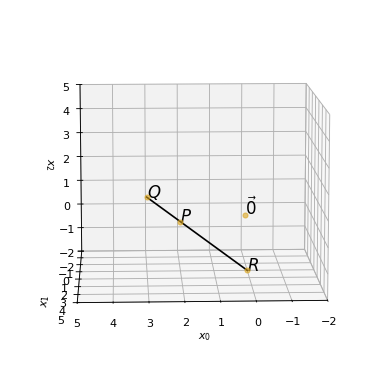

In [4]:
fig,ax=ejes3d(-2,-2,-2,5,5,5)  # Define el eje de coordenadas
                              # Desde la coordenada (0,0,0)ₜ
P=sp.Matrix([2,1,0])                             # Hasta la coordenada (10,10,10)ₜ
Q=sp.Matrix([3,1,1])
R=sp.Matrix([0,1,-2])

punto3d(ax,P,nombre=r'$P$')  # Coloca el punto
punto3d(ax,Q,nombre=r'$Q$')  # Coloca el punto
punto3d(ax,R,nombre=r'$R$')  # Coloca el punto
linea3d(ax,R,Q)  # Coloca  las línea entre dos extremos, si solo hay un extremo el otro es el origen

animacion3d(fig,ax)#,fps=10,segundos=1)

2. Encuentre los puntos de intersección entre l1 y  la recta l2: $\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+t_2\begin{pmatrix}1\\2\\1\end{pmatrix}$ y graficar el punto y las dos rectas

Para encontrar la intersección de dos rectas escritas en forma vectorial
$$\begin{pmatrix}x\\y\\z\end{pmatrix}=\begin{pmatrix}2\\1\\0\end{pmatrix}+t_1\begin{pmatrix}1\\0\\1\end{pmatrix}$$

$$\begin{pmatrix}x\\y\\z\end{pmatrix}=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+t_2\begin{pmatrix}1\\2\\1\end{pmatrix}$$
se puede obtener igualando las dos rectas (los parámetros deben ser diferentes)

$$\begin{pmatrix}2\\1\\0\end{pmatrix}+t_1\begin{pmatrix}1\\0\\1\end{pmatrix}=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+t_2\begin{pmatrix}1\\2\\1\end{pmatrix}$$

$$t_1\begin{pmatrix}1\\0\\1\end{pmatrix}-t_2\begin{pmatrix}1\\2\\1\end{pmatrix}=\begin{pmatrix}-3\\-4\\-3\end{pmatrix}$$

$$\begin{bmatrix}1&-1&:&-3\\0&-2&:&-4\\1&-1&:&-3\end{bmatrix}
$$

$$\begin{bmatrix}1&-1&:&-3\\0&-2&:&-4\\0&0&:&0\end{bmatrix}
$$

$$\begin{bmatrix}1&-1&:&-3\\0&-2&:&-4\\0&0&:&0\end{bmatrix}
$$

$$\begin{bmatrix}1&-1&:&-3\\0&1&:&2\\0&0&:&0\end{bmatrix}
$$

$t_2=2$

$$\begin{bmatrix}1&0&:&-1\\0&1&:&2\\0&0&:&0\end{bmatrix}
$$

$t_1=-1$

Con $t_2=2$ podemos encontrar el punto de intersección $S$

$$\begin{pmatrix}x\\y\\z\end{pmatrix}=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+2\begin{pmatrix}1\\2\\1\end{pmatrix}$$

$$l1\_l2=S=\begin{pmatrix}1\\1\\-1\end{pmatrix}$$

Se puede utilizar $t_1$ en la otra recta para verificar.

Para graficar $l_2$ se requiere definir los extremos que queremos graficar.

$$T=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+0\begin{pmatrix}1\\2\\1\end{pmatrix}=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}$$

$$U=\begin{pmatrix}-1\\-3\\-3\end{pmatrix}+4\begin{pmatrix}1\\2\\1\end{pmatrix}=\begin{pmatrix}3\\5\\1\end{pmatrix}$$

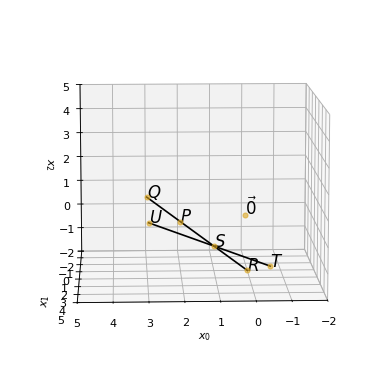

In [5]:
fig,ax=ejes3d(-2,-2,-2,5,5,5)  # Define el eje de coordenadas
                              # Desde la coordenada (0,0,0)ₜ
P=sp.Matrix([2,1,0])                             # Hasta la coordenada (10,10,10)ₜ
Q=sp.Matrix([3,1,1])
R=sp.Matrix([0,1,-2])
S=sp.Matrix([1,1,-1])
T=sp.Matrix([-1,-3,-3])
U=sp.Matrix([3,5,1])

punto3d(ax,P,nombre=r'$P$')  # Coloca el punto
punto3d(ax,Q,nombre=r'$Q$')  # Coloca el punto
punto3d(ax,R,nombre=r'$R$')  # Coloca el punto
punto3d(ax,S,nombre=r'$S$')
punto3d(ax,T,nombre=r'$T$')
punto3d(ax,U,nombre=r'$U$')
#punto3d(ax,R,nombre=r'$R$')
linea3d(ax,R,Q)
linea3d(ax,T,U)  # Coloca  las línea entre dos extremos, si solo hay un extremo el otro es el origen

animacion3d(fig,ax)#,fps=10,segundos=1)

  # Genera la animación para rotar

3. Dibuje el plano por el que pasan l1 y l2

Un plano está definido por 3 puntos no colineales, En este caso podemos usar los puntos $P$, $S$, $T$. En la aplicación solicitada o en Geogebra se puede graficar el plano mediante uba ecuación lineal.

Primero se encuentra un vector $W$ perpendicular al plano.

$$W=(P-S)×(T-S)$$
$$W=\left(\begin{pmatrix}2\\1\\0\end{pmatrix}-\begin{pmatrix}1\\1\\-1\end{pmatrix}\right)\times \left(\begin{pmatrix}-1\\-3\\-3\end{pmatrix}-\begin{pmatrix}1\\1\\-1\end{pmatrix}\right)$$
$$W=\begin{pmatrix}1\\0\\1\end{pmatrix}\times \begin{pmatrix}-2\\-4\\-2\end{pmatrix}$$
$$W=\begin{pmatrix}0+4\\-2+2\\-4+0\end{pmatrix}$$
$$W=\begin{pmatrix}4\\0\\-4\end{pmatrix}$$
y luego se aplica la ecuación punto-perpendicular del plano

$$(\vec{x}-S)×W=\vec{0}$$
$$\vec{x}×W-S×W=\vec{0}$$
$$\vec{x}×W=S×W$$
$$\begin{pmatrix}x_0\\x_1\\x_2\end{pmatrix}×\begin{pmatrix}4\\0\\-4\end{pmatrix}=\begin{pmatrix}1\\1\\-1\end{pmatrix}×\begin{pmatrix}4\\0\\-4\end{pmatrix}$$
$$4x_0+0x_1-4x_2=4+0+4$$
$$4x_0-4x_2=8$$
Para verificar, se miran si los puntos $P$, $S$, $T$ cumplen con la ecuación del plano

4. Dibuje una recta que pasa por la intersección de las rectas y es perpendicular a ambas

Es decir que la recta debe pasar por el punto intersección $$S=\begin{pmatrix}1\\1\\-1\end{pmatrix}$$
y tener la dirección del vector perpendicular $$W=\begin{pmatrix}4\\0\\-4\end{pmatrix}$$

Por lo tanto, la ecuación vectorial de la recta l3 es:

$$\vec{x}=S+tW$$
$$\begin{pmatrix}x_0\\x_1\\x_2\end{pmatrix}=\begin{pmatrix}1\\1\\-1\end{pmatrix}+t\begin{pmatrix}4\\0\\-4\end{pmatrix}$$

La ecuaciones simétricas

$$x_1=1$$
$$\frac{x_0-1}{4}=\frac{x_2+1}{-4}$$

y las lineales serían

$$x_1=1$$
$$x_0+x_2=0$$


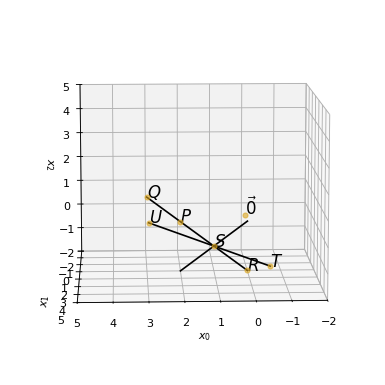

In [8]:
fig,ax=ejes3d(-2,-2,-2,5,5,5)  # Define el eje de coordenadas
                              # Desde la coordenada (0,0,0)ₜ
P=sp.Matrix([2,1,0])                             # Hasta la coordenada (10,10,10)ₜ
Q=sp.Matrix([3,1,1])
R=sp.Matrix([0,1,-2])
S=sp.Matrix([1,1,-1])
T=sp.Matrix([-1,-3,-3])
U=sp.Matrix([3,5,1])
l3a=sp.Matrix([0,1,0])
l3b=sp.Matrix([2,1,-2])

punto3d(ax,P,nombre=r'$P$')  # Coloca el punto
punto3d(ax,Q,nombre=r'$Q$')  # Coloca el punto
punto3d(ax,R,nombre=r'$R$')  # Coloca el punto
punto3d(ax,S,nombre=r'$S$')
punto3d(ax,T,nombre=r'$T$')
punto3d(ax,U,nombre=r'$U$')
#punto3d(ax,R,nombre=r'$R$')
linea3d(ax,R,Q)
linea3d(ax,T,U)  # Coloca  las línea entre dos extremos, si solo hay un extremo el otro es el origen
linea3d(ax,l3a,l3b)

animacion3d(fig,ax)#,fps=10,segundos=1)


Fin solucionario


Imagen de ejemplo para dibujar planos que pasan por el origen

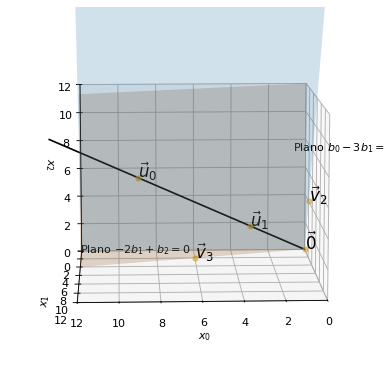

In [7]:
fig,ax=ejes3d(0,0,0,12,12,12)  # Define el eje de coordenadas
                              # Desde la coordenada (0,0,0)ₜ
                              # Hasta la coordenada (10,10,10)ₜ
u=sp.Matrix([9,3,6])
v_bis1=sp.Matrix([3,1,2])
v_bis2=sp.Matrix([0,2,4])
v_bis3=sp.Matrix([6,2,0])

punto3d(ax,u,nombre=r'$\vec{u}_0$')  # Coloca el punto
punto3d(ax,v_bis1,nombre=r'$\vec{u}_1$')  # Coloca el punto
punto3d(ax,v_bis2,nombre=r'$\vec{v}_2$')  # Coloca el punto
punto3d(ax,v_bis3,nombre=r'$\vec{v}_3$')  # Coloca el punto
plano3d(ax,u,v_bis2,color='k')
linea3d(ax,1.5*u)  # Coloca  las línea entre dos extremos, si solo hay un extremo el otro es el origen
ax.plot_surface([[0,0],[12,12]],[[0,0],[4,4]], np.array([[0.,12.],[0.,12.]]), alpha=0.2)#Plano vertical dibujado manualmente
ax.text(1,4,8,r'Plano $b_0 - 3b_1 =0$',rotation=24)
ax.text(12,4,1,r'Plano $-2 b_1 +b_2=0$',rotation=24)



animacion3d(fig,ax)#,fps=10,segundos=1)  # Genera la animación para rotar